In [7]:
import os
import skimage
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

In [8]:
dataset_path = os.path.join(os.getcwd(), "..", "..", "dataset", "Need to do measurement")

prediction_number = 3

need_to_measure_1 = cv.imread(os.path.join(dataset_path, "0212160.tiff"), cv.IMREAD_GRAYSCALE)
need_to_measure_2 = cv.imread(os.path.join(dataset_path, "0310975.tiff"), cv.IMREAD_GRAYSCALE)
need_to_measure_3 = cv.imread(os.path.join(dataset_path, "0802005.tiff"), cv.IMREAD_GRAYSCALE)

pred_result_1 = cv.imread(os.path.join(dataset_path, "predicted", f"0212160_prediction_{prediction_number}.tiff"), cv.IMREAD_GRAYSCALE)
pred_result_2 = cv.imread(os.path.join(dataset_path, "predicted", f"0310975_prediction_{prediction_number}.tiff"), cv.IMREAD_GRAYSCALE)
pred_result_3 = cv.imread(os.path.join(dataset_path, "predicted", f"0802005_prediction_{prediction_number}.tiff"), cv.IMREAD_GRAYSCALE)

[ WARN:0@65.472] global loadsave.cpp:248 findDecoder imread_('/home/vin/Documents/projects/mandible2024/src/vin/../../dataset/Need to do measurement/predicted/need-to-do-measurement/0212160.tiff'): can't open/read file: check file path/integrity
[ WARN:0@65.472] global loadsave.cpp:248 findDecoder imread_('/home/vin/Documents/projects/mandible2024/src/vin/../../dataset/Need to do measurement/predicted/need-to-do-measurement/0310975.tiff'): can't open/read file: check file path/integrity
[ WARN:0@65.473] global loadsave.cpp:248 findDecoder imread_('/home/vin/Documents/projects/mandible2024/src/vin/../../dataset/Need to do measurement/predicted/need-to-do-measurement/0802005.tiff'): can't open/read file: check file path/integrity
[ WARN:0@65.473] global loadsave.cpp:248 findDecoder imread_('/home/vin/Documents/projects/mandible2024/src/vin/../../dataset/Need to do measurement/predicted/pred-result/0212160_prediction_3.tiff'): can't open/read file: check file path/integrity
[ WARN:0@65.47

In [10]:
need_to_measure_1

TypeError: Image data of dtype object cannot be converted to float

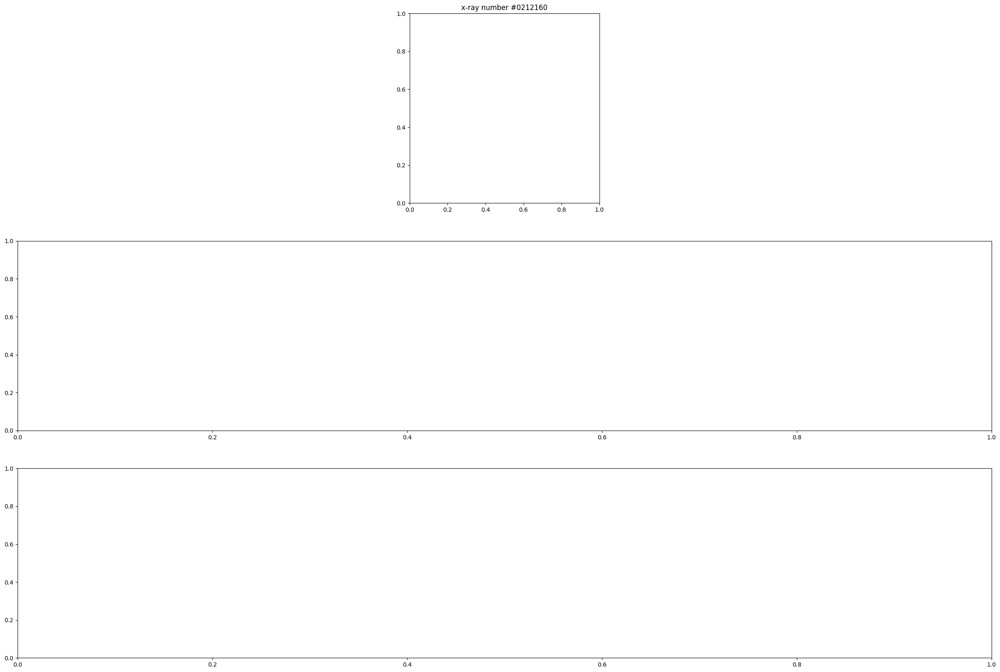

In [9]:
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(30, 20))

for ax, img, title in zip(axes, [need_to_measure_1, need_to_measure_2, need_to_measure_3], ["0212160", "0310975", "0802005"]):
    ax.set_title(f"x-ray number #{title}")
    ax.imshow(img, cmap="gray")
    ax.axis("off")

fig.tight_layout()

In [ ]:
def get_mask_region(mask: cv.Mat):
    y, x = np.argwhere(mask > 0).T
    
    return min(x), min(y), max(x), max(y)

In [ ]:
min_x1, min_y1, max_x1, max_y1 = get_mask_region(pred_result_1)
min_x2, min_y2, max_x2, max_y2 = get_mask_region(pred_result_2)
min_x3, min_y3, max_x3, max_y3 = get_mask_region(pred_result_3)

In [ ]:
mask_region_1 = need_to_measure_1[int(min_y1):int(max_y1), int(min_x1):int(max_x1)]
mask_region_2 = need_to_measure_2[int(min_y2):int(max_y2), int(min_x2):int(max_x2)]
mask_region_3 = need_to_measure_3[int(min_y3):int(max_y3), int(min_x3):int(max_x3)]

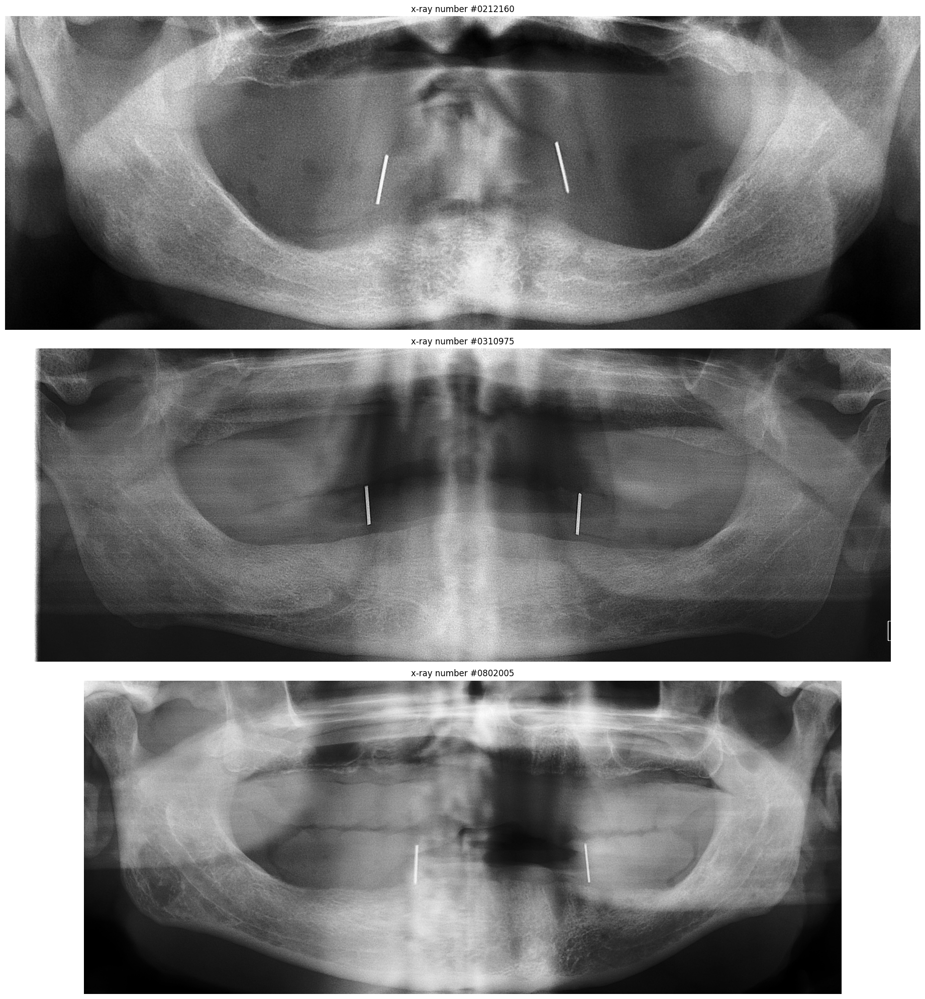

In [ ]:
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(30, 20))

for ax, img, title in zip(axes, [mask_region_1, mask_region_2, mask_region_3], ["0212160", "0310975", "0802005"]):
    ax.set_title(f"x-ray number #{title}")
    ax.imshow(img, cmap="gray")
    ax.axis("off")

fig.tight_layout()

In [ ]:
clahe_1 = skimage.exposure.equalize_adapthist(mask_region_1, kernel_size=((mask_region_1.shape[1] / 24), (mask_region_1.shape[0] / 24)))
clahe_2 = skimage.exposure.equalize_adapthist(mask_region_2, kernel_size=((mask_region_2.shape[1] / 24), (mask_region_2.shape[0] / 24)))
clahe_3 = skimage.exposure.equalize_adapthist(mask_region_3, kernel_size=((mask_region_3.shape[1] / 24), (mask_region_3.shape[0] / 24)))

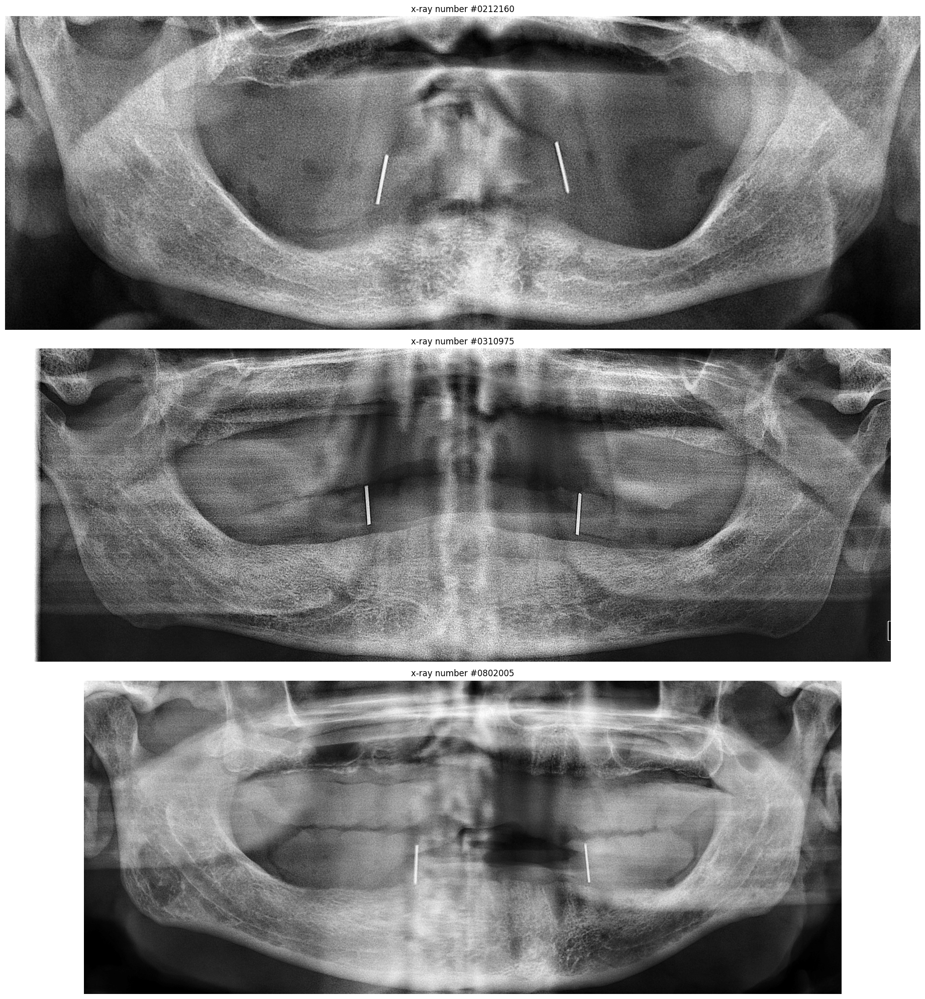

In [ ]:
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(30, 20))

for ax, img, title in zip(axes, [clahe_1, clahe_2, clahe_3], ["0212160", "0310975", "0802005"]):
    ax.set_title(f"x-ray number #{title}")
    ax.imshow(img, cmap="gray")
    ax.axis("off")

fig.tight_layout()

In [ ]:
def get_edges(img: cv.Mat):
    scharr = skimage.filters.scharr(img)
    percentile = np.linspace(np.min(scharr), np.max(scharr), 100, dtype=np.float64)
    edges = skimage.filters.apply_hysteresis_threshold(scharr, percentile[18], percentile[60]).astype(np.uint8)
    edges[edges == 1] = 255
    
    return edges

In [ ]:
edges_1 = get_edges(clahe_1)
edges_2 = get_edges(clahe_2)
edges_3 = get_edges(clahe_3)

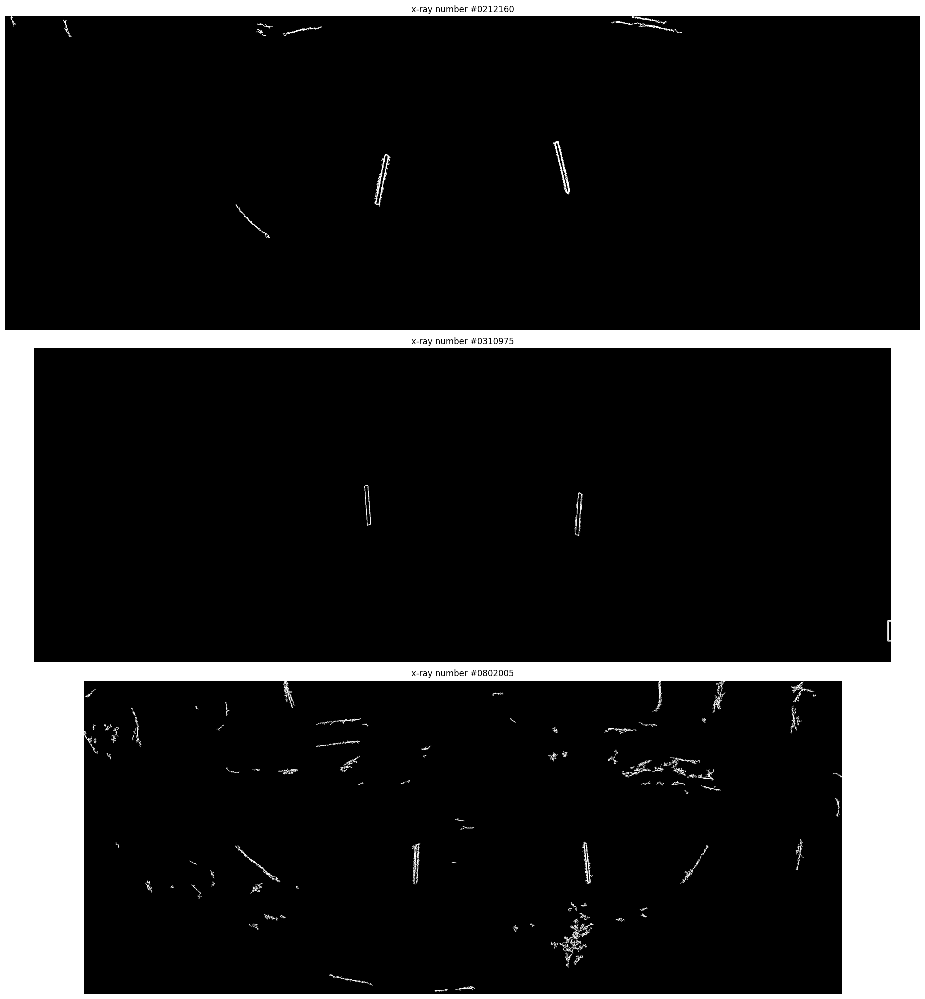

In [ ]:
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(30, 20))

for ax, img, title in zip(axes, [edges_1, edges_2, edges_3], ["0212160", "0310975", "0802005"]):
    ax.set_title(f"x-ray number #{title}")
    ax.imshow(img, cmap="gray")
    ax.axis("off")

fig.tight_layout()

In [ ]:
pin_location = []

for edge, img, title in zip([edges_1, edges_2, edges_3], [mask_region_1, mask_region_2, mask_region_3], ["0212160", "0310975", "0802005"]):
    edge_copy = edge.astype(np.uint8) * 255
    
    contours, hierarchy = cv.findContours(edge_copy, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_NONE)
    
    for contour in contours:
        lines = []
        mid_points = []
    
        if len(contour) > 100:
            xs, ys = contour.T
            x1, y1, x2, y2 = np.min(xs), np.min(ys), np.max(xs), np.max(ys)
            
            x_length, y_length = x2 - x1, y2 - y1
            x_mid_point, y_mid_point = (x_length / 2) + x1, (y_length / 2) + y1 
            
            if y_length > x_length and y_length > 40:
                for current_y in range(y1, y2):
                    contour_reshape = contour.reshape((contour.shape[0], 2))
                    if contour_reshape[contour_reshape[:, 1] == current_y].shape[0] > 0:
                        min_x, max_x = np.min(contour_reshape[contour_reshape[:, 1] == current_y].T[0]), np.max(contour_reshape[contour_reshape[:, 1] == current_y].T[0])    
                        
                        if img[current_y, min_x:max_x].shape[0] > 0:
                            mid_points.append(((((max_x - min_x) // 2) + min_x), current_y))

                        color = img[int(y_mid_point), int(x_mid_point)]
                        
        if len(mid_points) > 0 and y_length > x_length and \
            x1 > img.shape[1] * 0.25 and x1 < img.shape[1] * 0.75 \
            and y1 > img.shape[0] * 0.25 and y1 < img.shape[0] * 0.75:
                
            mid_points_t = np.array(mid_points).T
            mx1, my1, mx2, my2 = np.min(mid_points_t[0]), np.min(mid_points_t[1]), np.max(mid_points_t[0]), np.max(mid_points_t[1]) 
            height = np.sqrt((mx2 - mx1) ** 2 + (my2 - my1) ** 2)
        
            pin_location.append({
                "title": title,
                "img": img,
                "midpoints": mid_points,
                "height": height,
                "contour": contour,
                "x1": x1,
                "x2": x2,
                "y1": x1,
                "y2": y2,
            })
            

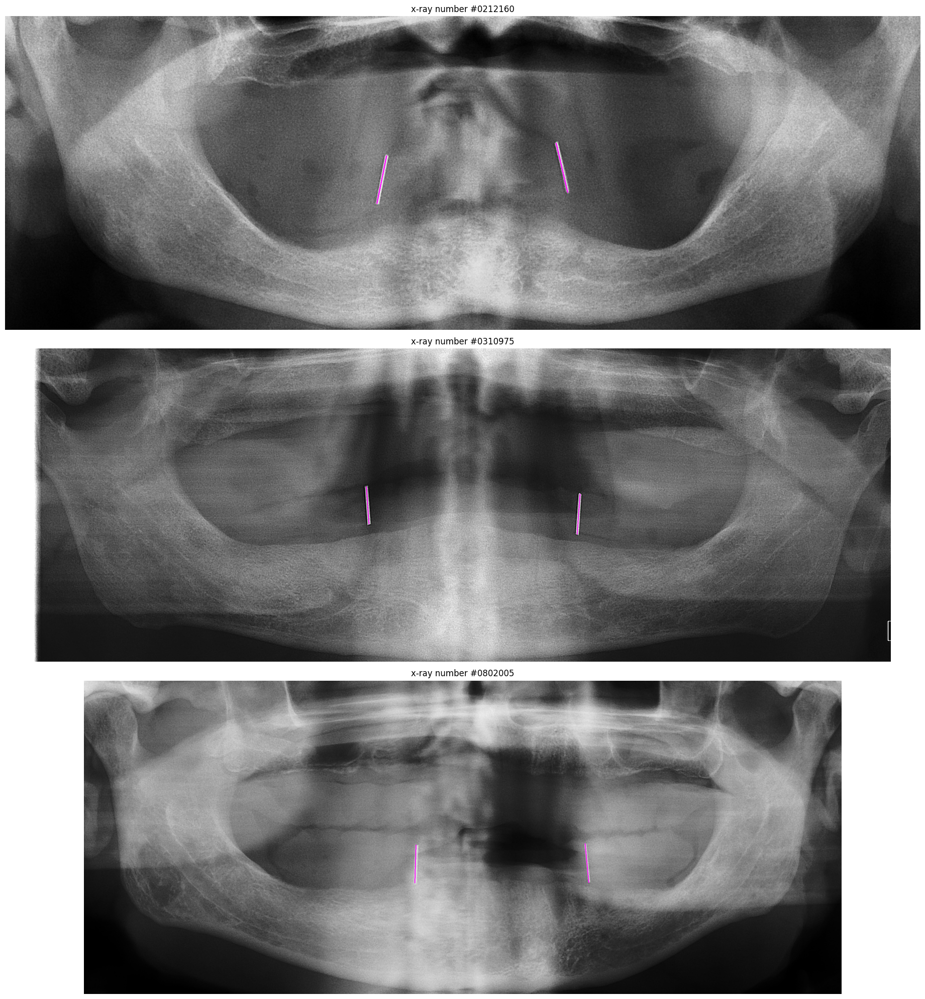

In [ ]:
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(30, 20))

pin_height = []

for ax, img, title in zip(axes, [mask_region_1, mask_region_2, mask_region_3], ["0212160", "0310975", "0802005"]):
    img = cv.cvtColor(img, cv.COLOR_GRAY2BGR)
    for pin in pin_location:
        if pin["title"] == title:
            cv.line(img, pin["midpoints"][5], pin["midpoints"][-5], (255, 0, 255), 2)    
            
    ax.imshow(img, cmap="gray")
    ax.set_title(f"x-ray number #{title}")
    ax.axis("off")
    
fig.tight_layout()

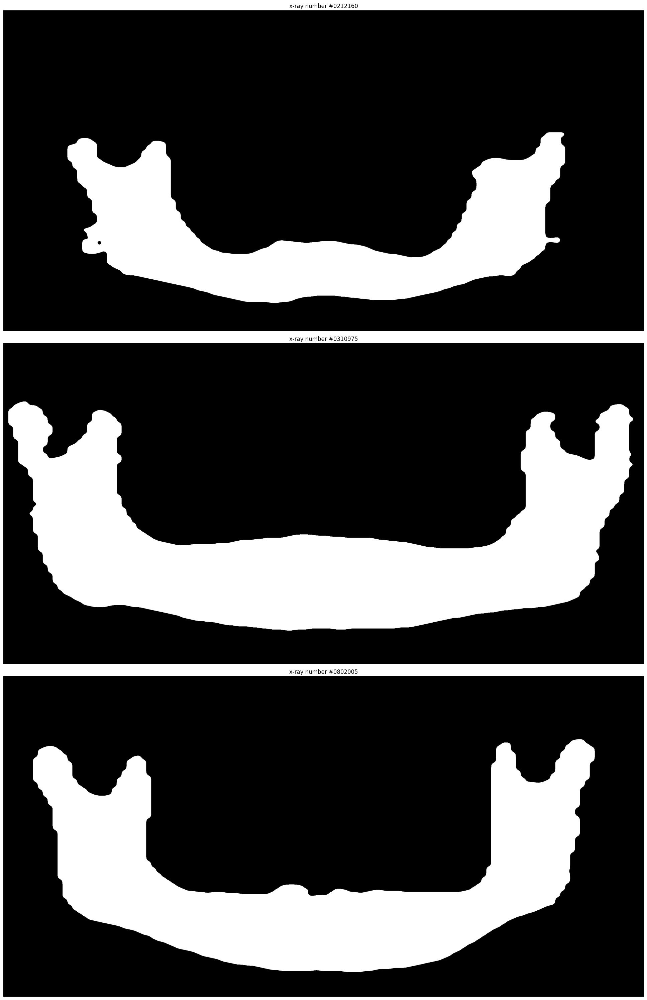

In [ ]:
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(40, 30))

for ax, img, title in zip(axes, [pred_result_1, pred_result_2, pred_result_3], ["0212160", "0310975", "0802005"]):
    ax.set_title(f"x-ray number #{title}")
    ax.imshow(img, cmap="gray")
    ax.axis("off")

fig.tight_layout()

In [ ]:
def lines_to_points(mask: np.array):
    top = []
    bottom = []

    for x in range(mask.shape[1]):
        points = np.argwhere(mask[:, x] > 0)

        if points.shape[0] > 0:
            bottom.append((x, max(points)[0]))

            if max(points) - min(points) > 100:
                top.append((x, min(points)[0]))

    return top, bottom

In [ ]:
top_coords_1, bottom_coords_1 = lines_to_points(pred_result_1)
top_coords_2, bottom_coords_2 = lines_to_points(pred_result_2)
top_coords_3, bottom_coords_3 = lines_to_points(pred_result_3)

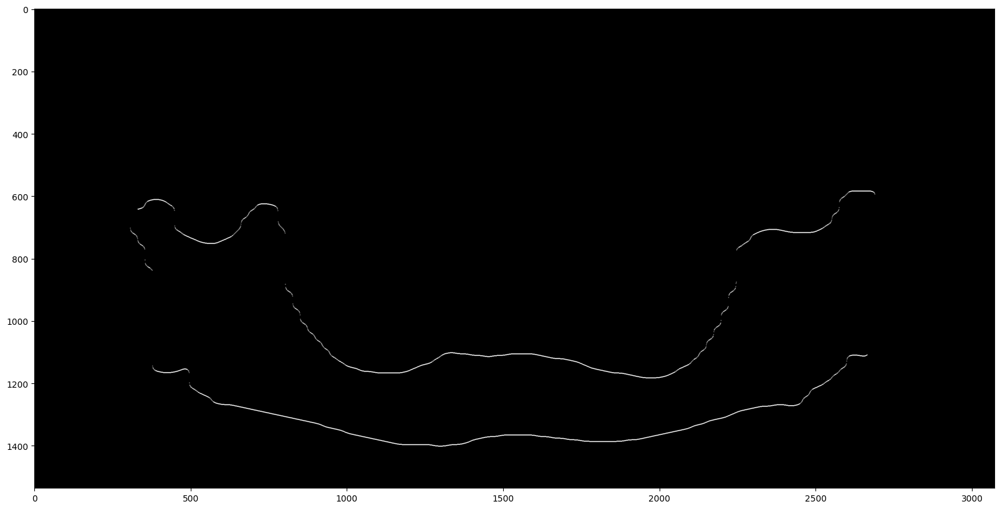

In [ ]:
plt.figure(figsize=(20, 10))

img_1 = np.zeros(need_to_measure_1.shape)

for top_coord, bottom_coord in zip(top_coords_1, bottom_coords_1):    
    cv.circle(img_1, top_coord, 1, (255, 255, 255), 1)
    cv.circle(img_1, bottom_coord, 1, (255, 255, 255), 1)

plt.imshow(img_1, cmap="gray")
plt.show()

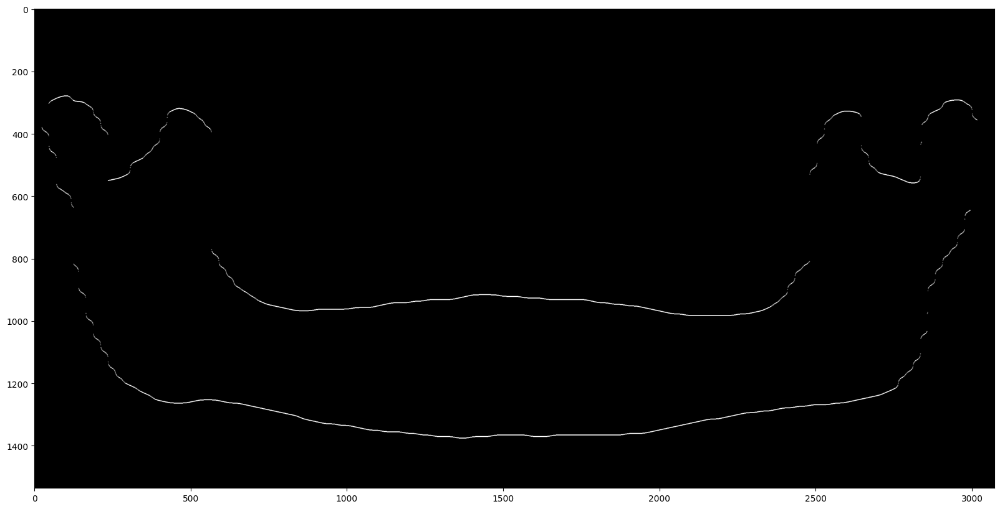

In [ ]:
plt.figure(figsize=(20, 10))

img_2 = np.zeros(need_to_measure_2.shape)

for top_coord, bottom_coord in zip(top_coords_2, bottom_coords_2):    
    cv.circle(img_2, top_coord, 1, (255, 255, 255), 1)
    cv.circle(img_2, bottom_coord, 1, (255, 255, 255), 1)

plt.imshow(img_2, cmap="gray")
plt.show()

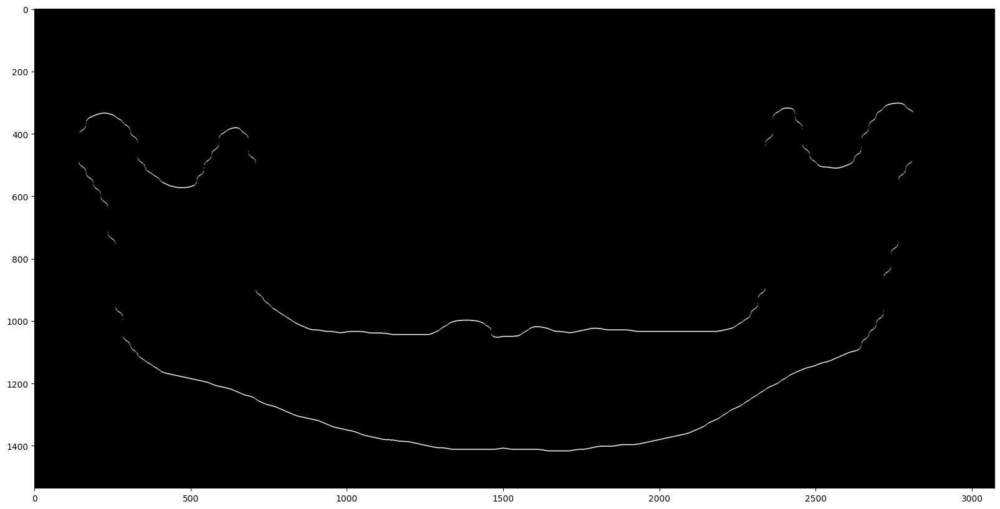

In [ ]:
plt.figure(figsize=(20, 10))

img_3 = np.zeros(need_to_measure_3.shape)

for top_coord, bottom_coord in zip(top_coords_3, bottom_coords_3):    
    cv.circle(img_3, top_coord, 1, (255, 255, 255), 1)
    cv.circle(img_3, bottom_coord, 1, (255, 255, 255), 1)

plt.imshow(img_3, cmap="gray")
plt.show()

In [ ]:
def get_mandible_height(top_snake: np.array, bottom_snake: np.array, img: cv.Mat) -> float:
    cv.cvtColor(img, cv.COLOR_GRAY2BGR)
    min_y = min(top_snake.T[1])
    max_y = max(bottom_snake.T[1])
    
    top_boundary = round(min_y + (max_y - min_y) * 0.45)
    
    min_height = None
    
    p1_x, p1_y = (0, 0)
    p2_x, p2_y = (0, 0)
    
    for (x1, y1) in top_snake:
        if y1 >= top_boundary:
            i = 0
            for (x2, y2) in bottom_snake:
                i += 1
                height = np.sqrt((x2 - x1) ** 2 + (y2 - y1) ** 2)
                
                if min_height == None or min_height > height:
                    min_height = height
                    p1_x, p2_x, p1_y, p2_y = x1, x2, y1, y2
                    
    measure_side = "right" if p1_x > img.shape[0] // 2 else "left"
    
    measure_height = np.sqrt((p2_x - p1_x) ** 2 + (p2_y - p1_y) ** 2)
    
    cv.line(img, (p1_x, p1_y), (p2_x, p2_y), (255, 255, 0), 2)
    
    
    return min_height, measure_height, measure_side

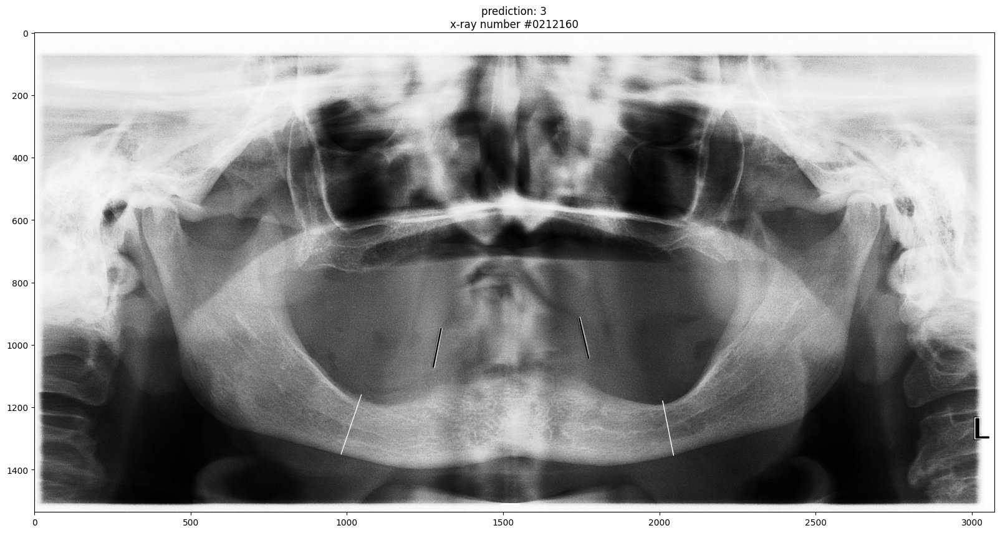

In [ ]:
plt.figure(figsize=(20, 10))
min_height_right_1, right_height_1, _ = get_mandible_height(np.array(top_coords_1[:len(top_coords_1)//2]), np.array(bottom_coords_1[:len(bottom_coords_1)//2]), need_to_measure_1)
min_height_left_1, left_height_1, _ = get_mandible_height(np.array(top_coords_1[len(top_coords_1)//2:]), np.array(bottom_coords_1[len(bottom_coords_1)//2:]), need_to_measure_1)

right_top_x_1 = pin_location[0]["midpoints"][5][0] + min_x1
right_top_y_1 = pin_location[0]["midpoints"][5][1] + min_y1
right_bot_x_1 = pin_location[0]["midpoints"][-5][0] + min_x1
right_bot_y_1 = pin_location[0]["midpoints"][-5][1] + min_y1

left_top_x_1 = pin_location[1]["midpoints"][5][0] + min_x1
left_top_y_1 = pin_location[1]["midpoints"][5][1] + min_y1
left_bot_x_1 = pin_location[1]["midpoints"][-5][0] + min_x1
left_bot_y_1 = pin_location[1]["midpoints"][-5][1] + min_y1

cv.line(need_to_measure_1, (right_top_x_1, right_top_y_1), (right_bot_x_1, right_bot_y_1), (0, 0, 0), 3)
cv.line(need_to_measure_1, (left_top_x_1, left_top_y_1), (left_bot_x_1, left_bot_y_1), (0, 0, 0), 3)

plt.imshow(need_to_measure_1, cmap="gray")
plt.title(f"prediction: {prediction_number}\nx-ray number #0212160")
plt.savefig(f"#0212160_{prediction_number}.png")
plt.show()

In [ ]:
right_mandible_1 = right_height_1 / pin_location[0]["height"]
left_mandible_1 = left_height_1 / pin_location[1]["height"]

print("#0212160 (right):", right_mandible_1, "#0212160 (left):", left_mandible_1)

#0212160 (right): 1.486647414237809 #0212160 (left): 1.2685246358190632


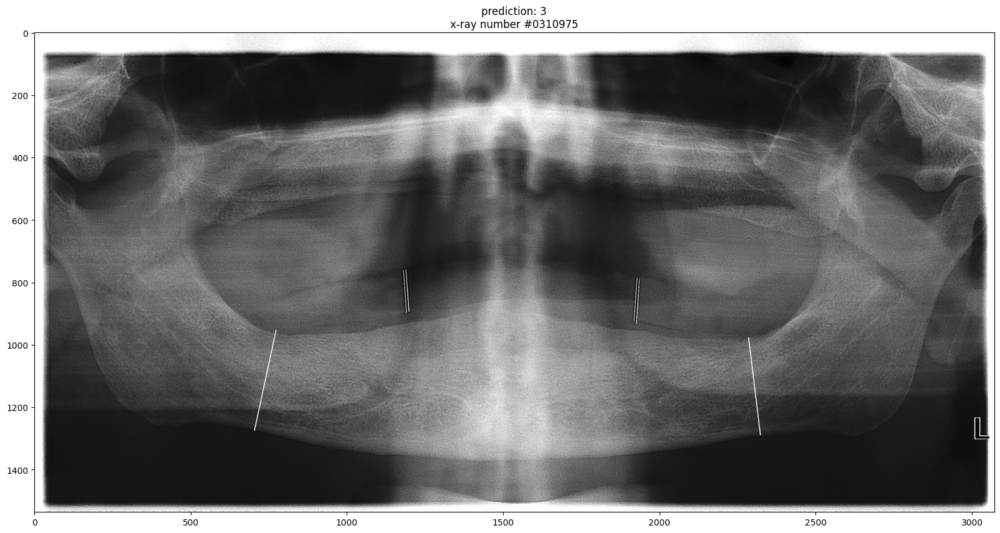

In [ ]:
plt.figure(figsize=(20, 10))

min_height_right_2, right_height_2, _ = get_mandible_height(np.array(top_coords_2[:len(top_coords_2)//2]), np.array(bottom_coords_2[:len(bottom_coords_2)//2]), need_to_measure_2)
min_height_left_2, left_height_2, _ = get_mandible_height(np.array(top_coords_2[len(top_coords_2)//2:]), np.array(bottom_coords_2[len(bottom_coords_2)//2:]), need_to_measure_2)

right_top_x_2 = pin_location[2]["midpoints"][5][0] + min_x2
right_top_y_2 = pin_location[2]["midpoints"][5][1] + min_y2
right_bot_x_2 = pin_location[2]["midpoints"][-5][0] + min_x2
right_bot_y_2 = pin_location[2]["midpoints"][-5][1] + min_y2

left_top_x_2 = pin_location[3]["midpoints"][5][0] + min_x2
left_top_y_2 = pin_location[3]["midpoints"][5][1] + min_y2
left_bot_x_2 = pin_location[3]["midpoints"][-5][0] + min_x2
left_bot_y_2 = pin_location[3]["midpoints"][-5][1] + min_y2

cv.line(need_to_measure_2, (right_top_x_2, right_top_y_2), (right_bot_x_2, right_bot_y_2), (0, 0, 0), 3)
cv.line(need_to_measure_2, (left_top_x_2, left_top_y_2), (left_bot_x_2, left_bot_y_2), (0, 0, 0), 3)

plt.imshow(need_to_measure_2, cmap="gray")
plt.title(f"prediction: {prediction_number}\nx-ray number #0310975")
plt.savefig(f"#0310975_{prediction_number}.png")
plt.show()

In [ ]:
right_mandible_2 = right_height_2 / pin_location[2]["height"]
left_mandible_2 = left_height_2 / pin_location[3]["height"]

print("#0310975 (right):", right_mandible_2, "#0310975 (left):", left_mandible_2)

#0310975 (right): 2.197590946288057 #0310975 (left): 2.26359298704718


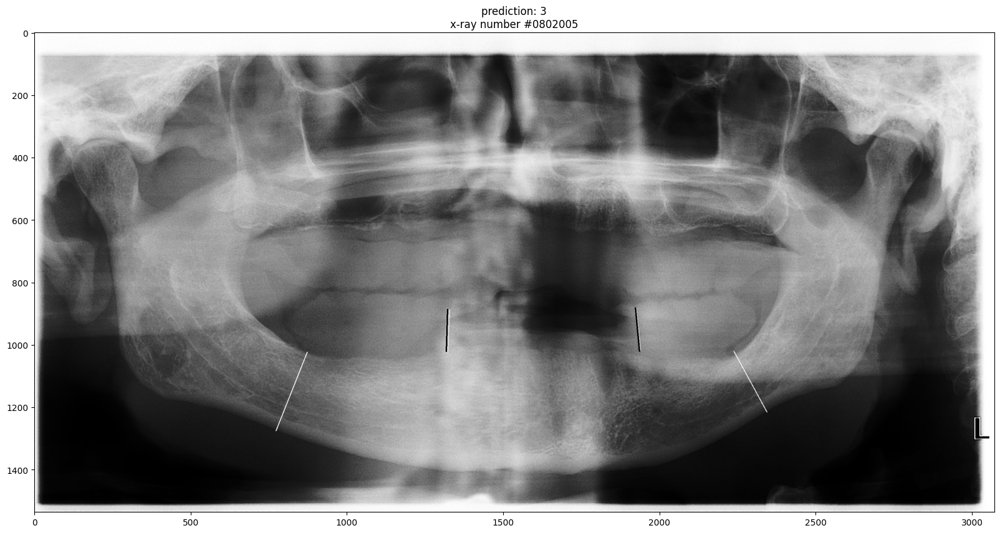

In [ ]:
plt.figure(figsize=(20, 10))
min_height_right_3, right_height_3, _ = get_mandible_height(np.array(top_coords_3[:len(top_coords_3)//2]), np.array(bottom_coords_3[:len(bottom_coords_3)//2]), need_to_measure_3)
min_height_left_3, left_height_3, _ = get_mandible_height(np.array(top_coords_3[len(top_coords_3)//2:]), np.array(bottom_coords_3[len(bottom_coords_3)//2:]), need_to_measure_3)

right_top_x_3 = pin_location[4]["midpoints"][5][0] + min_x3
right_top_y_3 = pin_location[4]["midpoints"][5][1] + min_y3
right_bot_x_3 = pin_location[4]["midpoints"][-5][0] + min_x3
right_bot_y_3 = pin_location[4]["midpoints"][-5][1] + min_y3

left_top_x_3 = pin_location[5]["midpoints"][5][0] + min_x3
left_top_y_3 = pin_location[5]["midpoints"][5][1] + min_y3
left_bot_x_3 = pin_location[5]["midpoints"][-5][0] + min_x3
left_bot_y_3 = pin_location[5]["midpoints"][-5][1] + min_y3

cv.line(need_to_measure_3, (right_top_x_3, right_top_y_3), (right_bot_x_3, right_bot_y_3), (0, 0, 0), 3)
cv.line(need_to_measure_3, (left_top_x_3, left_top_y_3), (left_bot_x_3, left_bot_y_3), (0, 0, 0), 3)

plt.imshow(need_to_measure_3, cmap="gray")
plt.title(f"prediction: {prediction_number}\nx-ray number #0802005")
plt.savefig(f"#0802005_{prediction_number}.png")
plt.show()

In [ ]:
right_mandible_3 = right_height_3 / pin_location[4]["height"]
left_mandible_3 = left_height_3 / pin_location[5]["height"]

print("#0802005 (right):", right_mandible_3, "#0802005 (left):", left_mandible_3)

#0802005 (right): 1.86821262803562 #0802005 (left): 1.4788332684038688
